# Projet Traitement d'Image (CHPS0705) : Seam Carving

In [1]:
# Imports pour l'interaction avec le Jupyter Notebook
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

# Maths
import numpy as np

# Graphiques
import matplotlib as mpl
import matplotlib.pyplot as plt

# OpenCL
import pyopencl as cl
import time # pour mesurer le temps

## Implémentation des seams

Génération d'une image énergie de test $I_{e}$. On commencera par rechercher les seams verticaux.

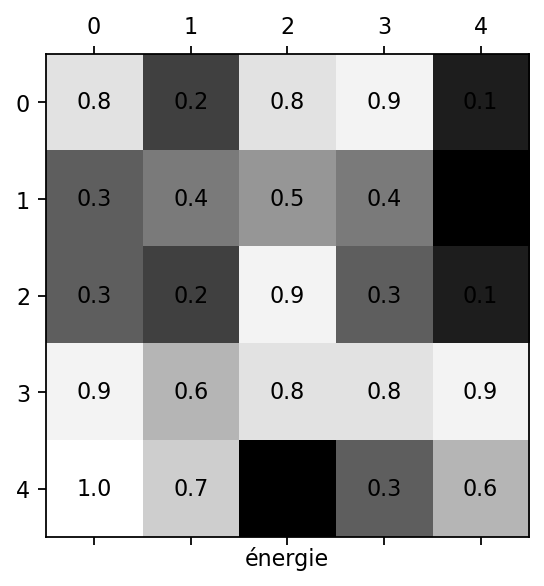

In [2]:
def matshow(image, dpi=80, text=True, integer=False, title=None, fig=None, ax=None, no_color=False, no_label=False, cmap='Greys_r'):
    
    if no_color:
        cmap = cmap=mpl.cm.get_cmap('Greys_r', 1)
        
    if fig is None:
        fig, ax = plt.subplots(nrows=1, ncols=1, dpi=dpi)
    
    cax = ax.matshow(image, cmap=cmap)
    
    if text:
        for (i, j), z in np.ndenumerate(image):
            if integer: format = '{:0.0f}'
            else: format = '{:0.1f}'
            ax.text(j, i, format.format(z), ha='center', va='center')
    
    if title is not None:
        ax.set_xlabel(title) # utiliser xlabel in titre déguisé pour le placer en bas
    
    if image.shape[0] == 1:
        ax.get_yaxis().set_visible(False)
    
    if no_label:
        ax.axis('off')
    
    return fig, ax

m = 5 # nb. lignes
n = m # nb. colonnes

image_size = (m, n)
image_energie = np.random.random(size=image_size)
image_energie = np.round(image_energie, decimals=1)
matshow(image_energie, dpi=160, title='énergie');

###### Recherche des seams verticaux par programmation dynamique.

Dans l'image suivante $I_{seams}$, chaque pixel $P$ contient l'énergie minimale du 8-chemin $s$ ayant pour extrémités ce pixel $P$ et un autre pixel $Q$ situé sur la dernière ligne de l'image, $s$ ayant un unique pixel sur chaque ligne située entre $P$ et $Q$.

Pour rechercher ces chemin optimaux, qui correspondent à l'ensemble des coutures (seams) verticales, on ne peut pas procéder itérativement en commençant par chaque pixel de la première ligne en ajoutant le pixel de la prochaine ligne ayant la plus basse énergie, car dans ce cas on peut ne peut pas passer par des chemins ayant un niveau bas d'énergie mais qui nécessitent de passer par certains pixels ayant une énergie plus importante.

Pour avoir la garanti de trouver les seams ayant la plus basse énergie, on procèdera par programmation dynamique en partant du bas de l'image.

Premièrement, les dernières lignes de $I_{e}$ et $I_{seams}$ sont forcément identiques, car dans ce cas $P$ = $Q$.

Ensuite, pour calculer l'avant-dernière ligne, ici on peut prendre le meilleur voisin du bas, car ceux-ci contiennent l'énergie _cumulée_. Même si pour l'avant-dernière-ligne, l'énergie cumulée en partant du bas et l'énergie tout court sont la même chose, l'idée reste valable pour toute ligne par récurrence.

L'algorithme est donc le suivant:

1. __Initialisation__

 * Commencer à la dernière ligne: $i = m$
 * Copier la dernière ligne: $\forall j, I_{seams}(i, j) \leftarrow I_{e}(i, j)$


2. __Récurrence__


- Pour $i$ allant de $m - 1$ à 1:
- Pour $j$ allant de 1 à $n$:

$I_{seams}(i, j) \leftarrow I_{e}(i, j) + \min \{ I_{seams}(i+1, j-1), I_{seams}(i+1, j+1), I_{seams}(i+1, j+1) \}$

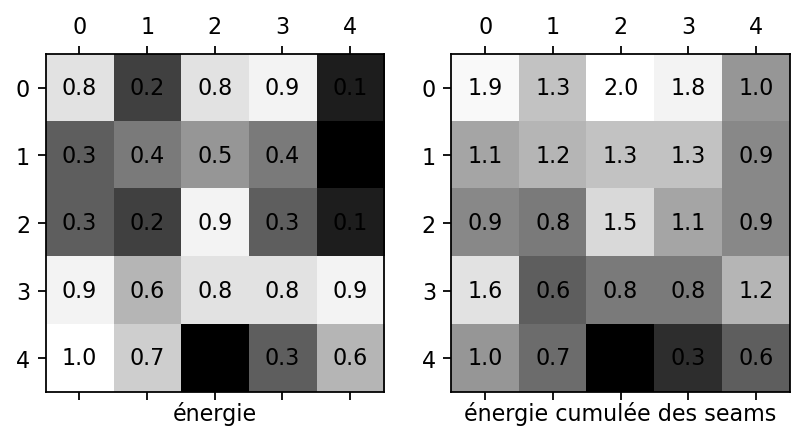

In [3]:
def extract_seams_energy_local_cumulate(image_energie):
    # extrait dans une matrice
    # l'énergie cumulée des pixels depuis le pixel actuel jusqu'au bord bas de l'écran
    # pour le chemin ayant le plus bas niveau d'énergie
    
    m, n = image_energie.shape[:2]
    
    image_seams = np.zeros_like(image_energie)

    # Initialisation
    for j in range(n):
        i = m - 1
        image_seams[i, j] = image_energie[i, j]

    # Récurrence
    for i in reversed(range(m-1)):
        for j in range(n):

            # éviter de sortir de l'image
            jmin = max(0, j - 1)
            jmax = min(n, j + 2)

            min_ligne = np.min(image_seams[i + 1, jmin : jmax])
            image_seams[i, j] = image_energie[i, j] + min_ligne
    
    return image_seams

fig, (ax_left, ax_right) = plt.subplots(nrows=1, ncols=2, dpi=160)

image_seams = extract_seams_energy_local_cumulate(image_energie)

matshow(image_energie, title='énergie', fig=fig, ax=ax_left)
matshow(image_seams, title='énergie cumulée des seams', fig=fig, ax=ax_right);

###### Récupération des chemins des seams verticaux

Maintenant que l'on connaît le poids de chaque seam optimal, il est aussi possible de connaître le chemin à suivre.
Outre le fait de parcourir les données en additionnant et comparer à $I_{seams}$, on peut directement stocker tous les chemins lors du parcours.

Le tableau _seams_locaux_ contiendra, pour chaque colonne, l'indice de la colonne de la prochaine ligne à suivre pour que le chemin __depuis le pixel courant__ soit d'énergie minimal. La dernière ligne n'ayant pas de prochain pixel à spécifier, le tableau sera donc de taille $(m - 1, n)$.

L'implémentation du kernel OpenCL, langage formé d'un sous-ensemble du C, se trouve dans le dossier du projet dans le fichier `kernel_seam_carving.cl`.

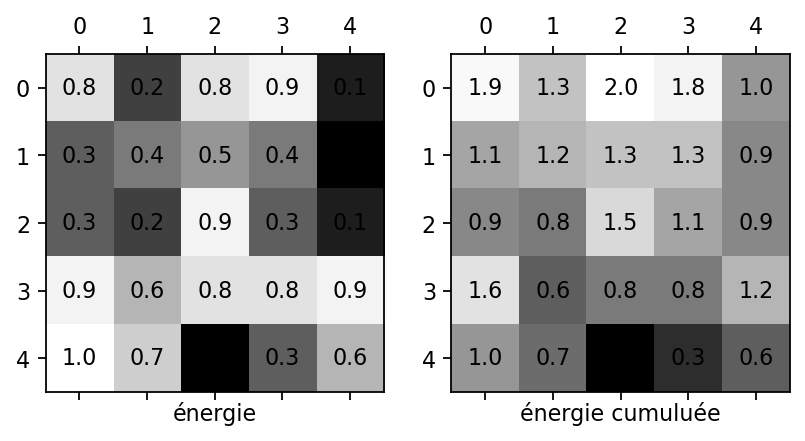

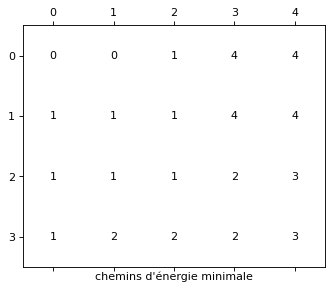

In [4]:
def extract_seams_energy_local(image_energie):
    m, n = image_energie.shape[:2]
    
    # Reprise de l'algorithme, avec en plus stockage des chemins.

    image_seams = np.zeros_like(image_energie)
    seams_locaux = np.zeros(shape=(m - 1, n), dtype=np.int)

    # Initialisation
    for j in range(n):
        i = m - 1
        image_seams[i, j] = image_energie[i, j]

    # Récurrence
    for i in reversed(range(m-1)):
        for j in range(n):

            # éviter de sortir de l'image
            jmin = max(0, j - 1)
            jmax = min(n, j + 2)

            image_seams_line_below = image_seams[i + 1]
            col_with_min_energy = jmin + np.argmin(image_seams_line_below[jmin : jmax])

            min_energy = image_seams_line_below[col_with_min_energy]
            image_seams[i, j] = image_energie[i, j] + min_energy

            seams_locaux[i, j] = col_with_min_energy
    
    return seams_locaux
    
fig, (ax_left, ax_right) = plt.subplots(nrows=1, ncols=2, dpi=160)

seams_cumule = extract_seams_energy_local_cumulate(image_energie)
seams = extract_seams_energy_local(image_energie)

matshow(image_energie, title='énergie', fig=fig, ax=ax_left)
matshow(seams_cumule, title='énergie cumuluée', fig=fig, ax=ax_right)
matshow(seams, title="chemins d'énergie minimale", integer=True, no_color=True);

Une fois que l'on a les chemins d'énergie minimale de proche en proche, on peut maintenant obtenir les chemins d'énergie minimale globaux _seams_ depuis chaque pixel de la première ligne.

Il faut bien noter que les chemins d'énergie minimal sur le graphique donnent l'indice du prochain voisin où aller, et ce récursivement. Il ne faut pas suivre une colonne, mais regarder à chaque ligne la colonne indiquée par la ligne précédente.

In [5]:
def extract_seams_energy(image_energie):
    # Extrait les chemins d'énergie (matrice d'entiers)
    
    m, n = image_energie.shape[:2]
    seams_locaux = extract_seams_energy_local(image_energie)
    
    seams = np.zeros(shape=(n, m), dtype=np.int)
    
    j = 0
    i = 1

    for j in range(n):
        seams[j, 0] = j

    for j in range(n):
        for i in range(1, m):
            seams[j, i] = seams_locaux[i - 1, seams[j, i - 1]]

    return seams

def compute_seam_energy(image_energie, seam):
    return sum(image_energie[y, x] for y, x in enumerate(s))

seams = extract_seams_energy(image_energie)
for j in range(n):
    s = seams[j]
    print(f'Chemin du pixel {j}: {s}, poids: {round(compute_seam_energy(image_energie, s), 1)}')


Chemin du pixel 0: [0 0 1 1 2], poids: 1.9
Chemin du pixel 1: [1 0 1 1 2], poids: 1.3
Chemin du pixel 2: [2 1 1 1 2], poids: 2.0
Chemin du pixel 3: [3 4 4 3 2], poids: 1.8
Chemin du pixel 4: [4 4 4 3 2], poids: 1.0


## Fonction d'énergie

Maintenant que nous savont comment extraire les _seams_ depuis une énergie, nous avons maintenant besoin de définir une fonction d'énergie. Pour ce faire, nous allons définir les zones d'importances comme étant des zones où la modulation de couleur est importante. C'est exactement ce à quoi sert le __filtre de Sobel__, qui approxime les dérivées partielles dans chaque dimension. Nous proposons d'effectuer ici l'implémentation du filtre de Sobel. Pour garantir les performances optimal, nous allons séparer le filtre et appliquer 2 fois les filtres 1D correspondant (au lieu du filtre 2D).

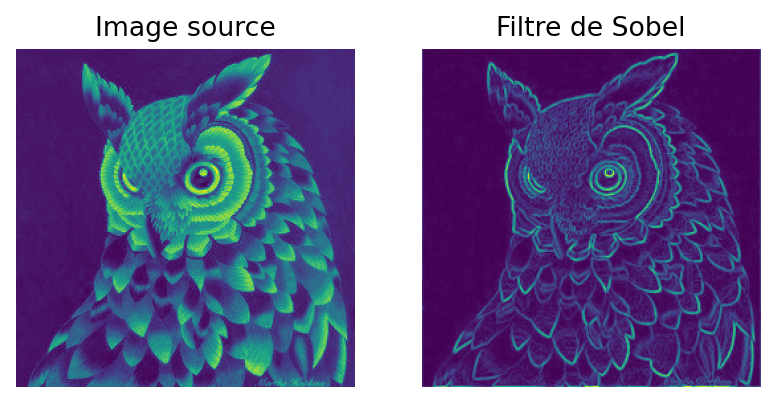

In [6]:
def imshow(image_src, title=None, **kwargs):
    fig, ax = plt.subplots(nrows=1, ncols=1, **kwargs)
    
    ax.axis('off')
    ax.imshow(image_src)
    
    if title is not None:
        ax.set_title(title)
        

def apply_kernel(image_src, kernel):
    image_dst = np.zeros_like(image_src, dtype=float)
    m, n = image_src.shape[:2]
    km, kn = kernel.shape
    rm, rn = km // 2, kn // 2
    
    for i_center in range(m):
        for j_center in range(n):
        
            window_imin = max(0, i_center - rm)
            window_imax = min(m, i_center + rm + 1)
            window_jmin = max(0, j_center - rn)
            window_jmax = min(n, j_center + rn + 1)

            s = 0.0
            n_window = (window_imax - window_imin) * (window_jmax - window_jmin)
            
            # gestion des bords: ne pas traiter les pixels en dehors de la fenêtre
            ik = 0
            for i_img in range(window_imin, window_imax):
                
                jk = 0
                for j_img in range(window_jmin, window_jmax):
                    s += kernel[ik, jk] * image_src[i_img, j_img]
                    jk += 1
                
                ik += 1

            s /= n_window
            image_dst[i_center, j_center] = s
        
    return image_dst

def sobel_filter(image_src):
    
    kernel_1 = np.array([[1., 2., 1.]])
    kernel_2 = np.array([[1., 0., -1.]])
    
    img_gx = apply_kernel(image_src, kernel_2)
    img_gx = apply_kernel(img_gx, np.transpose(kernel_1))
    
    img_gy = apply_kernel(image_src, kernel_1)
    img_gy = apply_kernel(img_gy, np.transpose(kernel_2))
    
    
    image_dst = np.sqrt(np.square(img_gx) + np.square(img_gy))
    
    return image_dst


image_src = plt.imread('data/sample2.jpg')
image_src = image_src[:, :, 0]

fig, (ax_left, ax_right) = plt.subplots(1, 2, dpi=160)

ax_left.axis('off')
ax_right.axis('off')

ax_left.set_title('Image source')
ax_left.imshow(image_src);

ax_right.set_title('Filtre de Sobel')
ax_right.imshow(sobel_filter(image_src));

###### Dessin des chemins

On peut maintenant visualiser les coutures générées. Plus la couture est visible, plus sont niveau d'énergie est haut.

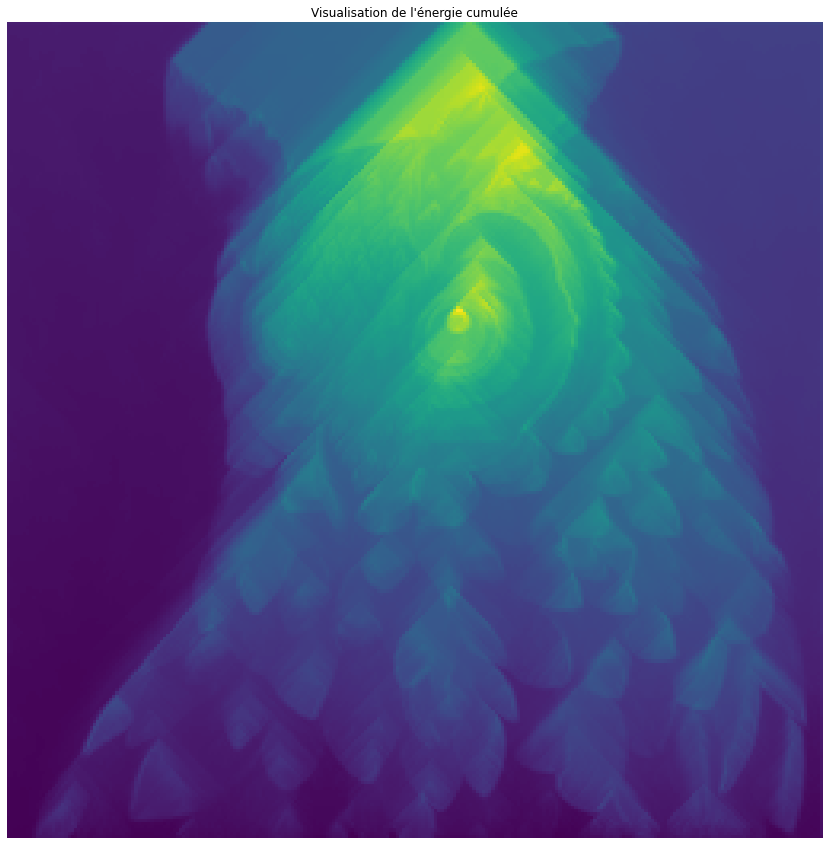

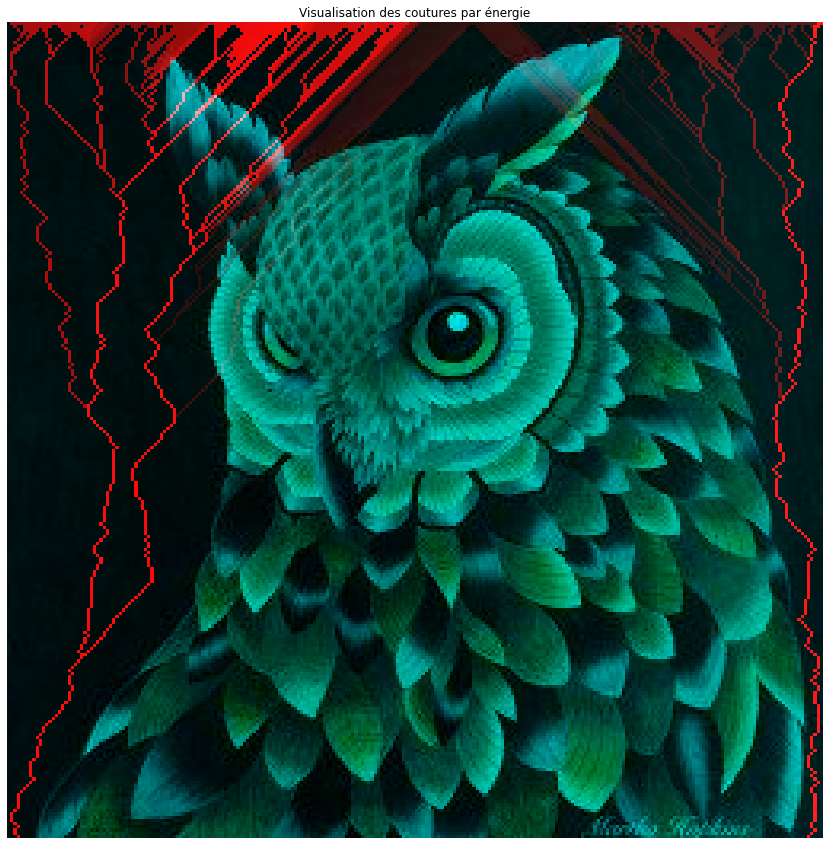

In [7]:
def vizualize_cumulated_energy(image_colored, image_energie):
    image_colored = image_colored.copy()
    
    m, n = image_energie.shape[:2]

    seams = extract_seams_energy(image_energie)
    seams_energy = [compute_seam_energy(image_energie, s) for s in seams]
    seams_sorted_by_energy_indices = np.argsort(seams_energy) # contient les indices si seams_energy était trié

    image_colored[:, :, :1] = 0

    max_intensity = 255

    for j in range(n):
        seam = seams[seams_sorted_by_energy_indices[j]]
        seam_intensity = max_intensity * j / n # 0.0 = plus faible intensité, 1.0 = plus forte intensité

        for i in range(m):
            col_id = seam[i]
            image_colored[i, col_id, 0] = seam_intensity


    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    ax.set_title("Visualisation de l'énergie cumulée")
    ax.axis('off')
    ax.imshow(extract_seams_energy_local_cumulate(image_energie).astype(dtype=float));

    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    ax.set_title('Visualisation des coutures par énergie')
    ax.axis('off')
    ax.imshow(image_colored)



image_colored = plt.imread('data/sample2.jpg')
image_src = image_colored[:, :, 2]
image_energie = sobel_filter(image_src)

vizualize_cumulated_energy(image_colored, image_energie)

On observe bien sur la visualisation des coutures par énergie (plus une couture, en rouge, est visible, plus l'énergie totale de la couture est élevée) que les coutures "évitent" les zones denses en information que l'on a défini comme l'intensité du gradient par le filtre de Sobel. Les coutures préfèrent passer par les bords appartenant au fond, noir, ce qui est conforme à l'effet voulu car lors de la suppression des chemins, ce sera alors le fond noir, peu porteur d'informations, qui sera enlevé en premier.

On observe sur l'oreille de gauche que certains chemins y passent, bien que l'oreille soit porteuse d'information (l'intensité du gradient y est relativement élevée). Cela est dû au fait que les coutures y passent depuis un pixel source plus loin que la diagonale du bord de l'oreille, car les pixels sont "piégés" entre les deux oreilles et ne peuvent pas en sortir. Cela est payé par le fait que ces coutures possèdent des plus hautes énergies, ce que l'on peut observer par la forte couleur rouge, les plus élevés de l'image. L'explication est que la diagonale est la seule direction maximale possible par la 8-adjacence que nous avons défini comme l'adjacence des coutures. Celles-ci ne peuvent donc pas suffisemment se diriger vers le noir, et supprimer l'oreille semble mieux que le corps de l'animal, bien plus porteur d'information que l'oreille, même si celui-ci en a légèrement.

## Rétrécissement d'image en largeur

Avec le *seam carving*, pour rétrécir une image dans une dimension, il faut en supprimer les chemins de plus faible énergie.
Ayant maintenant défini une fonction d'énergie ainsi que la récupération des seams, nous pouvons maintenant l'implémenter.

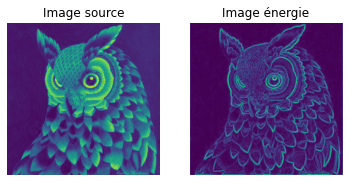

interactive(children=(IntSlider(value=0, description='x', max=254), Output()), _dom_classes=('widget-interact'…

In [8]:
image_src = plt.imread('data/sample2.jpg')[:, :, 0].astype(dtype=np.float)
image_energie_original = sobel_filter(image_src)
m, n = image_src.shape[:2]

def get_lowest_energy_seam_index(image_energie, seams):
    return np.argmin([compute_seam_energy(image_energie, s) for s in seams])

def get_lowest_energy_seam(image_energie, seams):
    return seams[get_lowest_energy_seam_index(image_energie, seams)]

def seam_carving_reduce_width_once(image_src):
    # Retire le chemin de plus basse énergie
    image_dst = np.copy(image_src)
    
    
    image_energie = sobel_filter(image_src)
    seams = extract_seams_energy(image_energie)
    
    lowest_energy_seam = get_lowest_energy_seam(image_energie, seams)
    
    m, n = image_src.shape[:2]
    
    # retire les pixels de chaque ligne un à un
    for i in range(m):
        
        j_to_delete = lowest_energy_seam[i]
        image_dst[i, 1 : j_to_delete + 1] = image_src[i, 0 : j_to_delete]
    
    # Retire la première colonne car on a tout décalé vers l'avant
    image_dst = np.delete(image_dst, 0, axis=1)
    
    return image_dst

images_cache = [None] * m
images_cache[0] = image_src

def interact_seam_carving_reduce_width(x):
    
    for i in range(x + 1):

        if images_cache[i] is not None:    
            image = images_cache[i]
        
        else:
            
            image = seam_carving_reduce_width_once(image)
            images_cache[i] = image
    
    fig, ax = plt.subplots(dpi=160)
    ax.set_title(f"Réduction de {x} en largeur")
    ax.imshow(image)

fig, (ax_left, ax_right) = plt.subplots(1, 2)

ax_left.axis('off')
ax_right.axis('off')

ax_left.set_title('Image source')
ax_left.imshow(image_src);

ax_right.set_title('Image énergie')
ax_right.imshow(image_energie_original);

interact(interact_seam_carving_reduce_width, x=widgets.IntSlider(min=0, max=m - 2, step=1, value=0));

# Optimisation

Pour pouvoir visualiser les tests plus rapidement, un profilage de code a été effectué. Plus de 85% du temps d'exécution est effectué dans la fonction `apply_kernel()`. La fonction de convolution implémenté est fonctionnel, mais nous passerons par la suite à une version optimisé du package `scipy.ndimage` pour gagner en temps d'exécution.

In [9]:
import scipy.ndimage

def apply_kernel(image_src, kernel): # remplacement de la fonction apply_kernel()
    return scipy.ndimage.convolve(image_src, kernel, mode='nearest')

Pour encore améliorer les performances, on se propose d'utiliser OpenCL. Le _seam carving_ étant une opération de redimensionnement d'image, elle est fortement adaptée à une implementation sur **GPU**.

Pour savoir quelle stratégie adopter, on peut remarquer que chaque étape est parallélisable.
Pour calculer l'énergie minimale cumulée ainsi que les chemins locaux associés, on remarque d'abord que l'exécution dees lignes est séquentielle: pour chaque ligne, on a besoin de la ligne d'en dessous. Cependant, chaque colonne peut être executée indépendemment, car elle ne nécessite pas les autres colonnes de la même ligne. Il faudra donc effectuer une synchronisation des threads (effectuée grâce à `barrier()`).

Ensuite, pour calculer les coutures, il suffit de parcourir l'image qui contient les chemins locaux. Chaque couture peut être calculée indépendemment, donc on utilisera 1 thread par couture (= 1 thread par colonne).

In [10]:
# Exemple OpenCL
'''
a = np.arange(100, dtype=np.float32).reshape(10, 10)

ctx = cl.create_some_context()
queue = cl.CommandQueue(ctx)
mf = cl.mem_flags

program = cl.Program(ctx, """

// Les tableaux numpy sont en 2D mais en 1D dans le code C
// Transforme une paire (ligne, colonne) en l'indice 1D
#define I(ligne, colonne) ((colonne) + (ligne) * (nb_colonnes))

#define K_MAX 3
#define BARRIER() barrier(CLK_GLOBAL_MEM_FENCE | CLK_LOCAL_MEM_FENCE)

__kernel void main(
    __global float *res,
    __global float *a)
{
    const int size = get_global_size(0);
    const int id = get_global_id(0);
    
    
    // Algorithme quelconque pour ne pas avoir la même vitesse
    
    if(id != 0) {
        res[id] = id;
    }
    else {
        for(int z = 0; z < 100; ++z) {
            res[z] = -1;
        }
    }
    
    BARRIER();
    // Une fois arrivé ici, tous les threads sont aussi après BARRIER().
    // Comme il y a synchronisation, les valeurs obtenues seront les entiers croissants
    // Sans qu'aucune valeur ne soit écrasée par une exécution de la boucle précédente
    
     res[id] = id;
}
""").build()

### Exécution

res = np.zeros_like(a)

a_buf = cl.Buffer(ctx, mf.READ_WRITE | mf.USE_HOST_PTR, hostbuf=a)
res_buf = cl.Buffer(ctx, mf.WRITE_ONLY, res.nbytes)
program.main(queue, [100], None, res_buf, a_buf)
cl.enqueue_copy(queue, res, res_buf)

print('res=')
print(res.astype(np.int32))

print('a=')
print(a)
'''

'\na = np.arange(100, dtype=np.float32).reshape(10, 10)\n\nctx = cl.create_some_context()\nqueue = cl.CommandQueue(ctx)\nmf = cl.mem_flags\n\nprogram = cl.Program(ctx, """\n\n// Les tableaux numpy sont en 2D mais en 1D dans le code C\n// Transforme une paire (ligne, colonne) en l\'indice 1D\n#define I(ligne, colonne) ((colonne) + (ligne) * (nb_colonnes))\n\n#define K_MAX 3\n#define BARRIER() barrier(CLK_GLOBAL_MEM_FENCE | CLK_LOCAL_MEM_FENCE)\n\n__kernel void main(\n    __global float *res,\n    __global float *a)\n{\n    const int size = get_global_size(0);\n    const int id = get_global_id(0);\n    \n    \n    // Algorithme quelconque pour ne pas avoir la même vitesse\n    \n    if(id != 0) {\n        res[id] = id;\n    }\n    else {\n        for(int z = 0; z < 100; ++z) {\n            res[z] = -1;\n        }\n    }\n    \n    BARRIER();\n    // Une fois arrivé ici, tous les threads sont aussi après BARRIER().\n    // Comme il y a synchronisation, les valeurs obtenues seront les enti

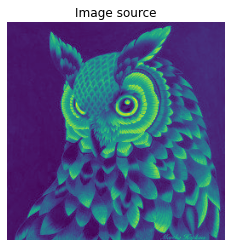

In [11]:
# float d'OpenCL = numpy.float32
# int d'OpenCL = numpy.int32
# on doit utiliser ce type pour les réels

image_src = plt.imread('data/sample2.jpg')[:, :, 0].astype(dtype=np.float32)
m, n = image_src.shape[:2]

image_energie = sobel_filter(image_src).astype(dtype=np.float32) # texture qui contient l'énergie (filtre de Sobel)
image_cumulate = np.zeros_like(image_src, dtype=np.float32) # texture qui contient l'énergie cumulée pour chaque pixel
image_local_seams = np.zeros(shape=(m - 1, n), dtype=np.int32) # contient les chemins correspondant à l'énergie cumulée
image_seams = np.zeros_like(image_src, dtype=np.int32)# texture d'entiers qui contient le chemin pour chaque pixel

### Initialisation OpenCL

class SeamCarvingGPU_Class:
    
    def __init__(self, fichier='kernel_seam_carving.cl'):
    
        self.ctx = cl.create_some_context()
        self.queue = cl.CommandQueue(self.ctx)
        self.mf = cl.mem_flags

        ### Lie les variables à OpenCL

        # On ne modifie pas l'énergie: lecture seulement
        # On veut l'énergie cumulée. Comme chaque pixel a besoin du précédent, on doit lire aussi: écriture + lecture
        # On veut aussi en sortie les chemins: écriture seulement
        # Pour ce faire, on doit stocker les chemins relatifs aux voisins (chemins locaux): lecture + écriture

        # taille maximale du buffer d'image (attention à mettre à la puissance de 2 par obtenir chaque dimension)
        # obligatoire pour ne pas avoir à récréer un buffer à chaque appel
        self.MAX_SIZE = 2000
        self.MAX_BYTES = (np.dtype(np.float32).itemsize * self.MAX_SIZE) ** 2
        
        self.energie_buf     = cl.Buffer(self.ctx, self.mf.READ_ONLY,  self.MAX_BYTES)
        self.cumulate_buf    = cl.Buffer(self.ctx, self.mf.READ_WRITE, self.MAX_BYTES)
        self.local_seams_buf = cl.Buffer(self.ctx, self.mf.READ_WRITE, self.MAX_BYTES)
        self.seams_buf       = cl.Buffer(self.ctx, self.mf.WRITE_ONLY, self.MAX_BYTES)
        
        # résultats (modifiés à chaque exécution)
        self.image_cumulate = None
        self.image_local_seams = None
        self.image_seams = None

        ### Programme OpenCL

        self.kernel_code = open(fichier, 'r').read()

        # On peut envoyer des arguments lors de la compilation du kernel (qui est à la volée) avec -Dcle=valeur un peu comme avec GCC
        # On créer un programme avec une synchronisation, et un sans, pour les comparer
        self.program_no_barrier = cl.Program(self.ctx, self.kernel_code).build("-DBARRIER()=")
        self.program            = cl.Program(self.ctx, self.kernel_code).build()

    ### Exécution
    
    def extraire_coutures(self, image_energie):
        image_energie = image_energie.astype(np.float32)
        
        nb_lignes   = np.int32(image_energie.shape[0])
        nb_colonnes = np.int32(image_energie.shape[1])
        m, n = nb_lignes, nb_colonnes
        
        self.image_cumulate    = np.empty(shape=(m, n),     dtype=np.float32)
        self.image_local_seams = np.empty(shape=(m - 1, n), dtype=np.int32)
        self.image_seams       = np.empty(shape=(n, m),     dtype=np.int32)
        
        cl.enqueue_copy(self.queue, self.energie_buf, image_energie)
        
        kernel_arguments = (self.energie_buf, self.cumulate_buf, self.local_seams_buf, self.seams_buf, nb_lignes)
        self.program.extraire_coutures(self.queue, [nb_colonnes], None, *kernel_arguments)
        
        cl.enqueue_copy(self.queue, self.image_cumulate,     self.cumulate_buf)
        cl.enqueue_copy(self.queue, self.image_local_seams,  self.local_seams_buf)
        cl.enqueue_copy(self.queue, self.image_seams,        self.seams_buf)
        
        return self.image_seams


SeamCarvingGPU = SeamCarvingGPU_Class()



t1 = time.time()

SeamCarvingGPU.extraire_coutures(image_energie)
image_cumulate_gpu = SeamCarvingGPU.image_cumulate
image_chemins_gpu = SeamCarvingGPU.image_local_seams
image_seams_gpu = SeamCarvingGPU.image_seams

t2 = time.time()
t_gpu = t2 - t1


# on ne mesure que le temps de extract_seams_energy()
# car extract_seams_energy() appelle indirectement extract_seams_energy_local()

t1 = time.time()

image_seams_cpu = extract_seams_energy(image_energie)

t2 = time.time()
t_cpu = t2 - t1

image_cumulate_cpu = extract_seams_energy_local_cumulate(image_energie)
image_chemins_cpu = extract_seams_energy_local(image_energie)

imshow(image_src, title='Image source')

## Test sur une petite matrice

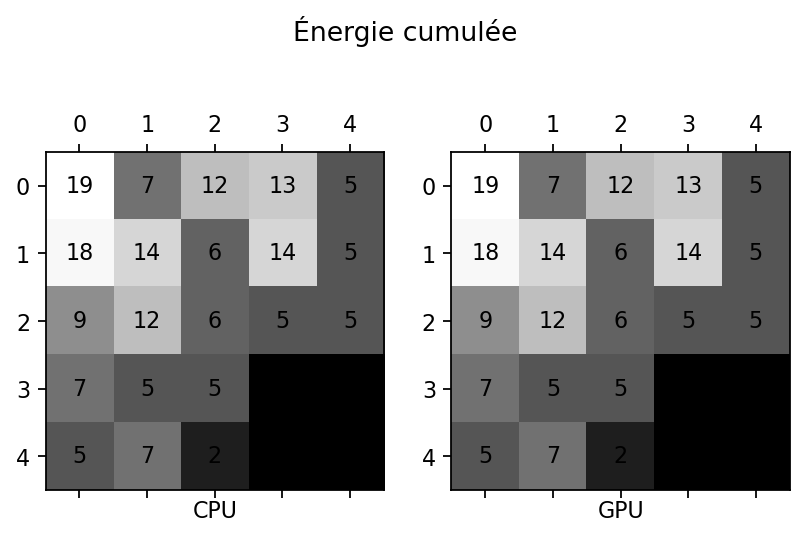

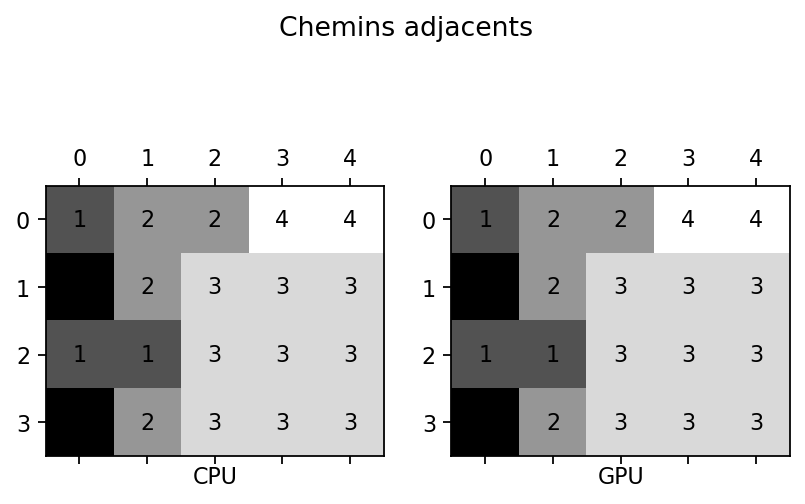

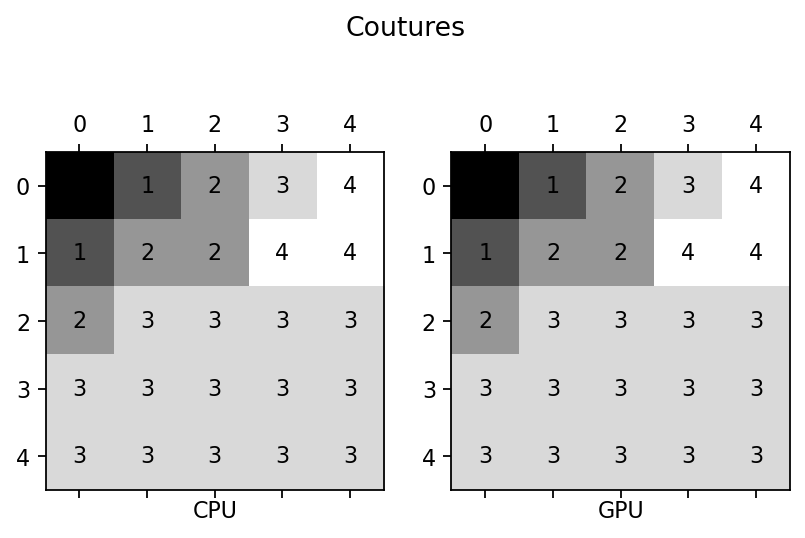

In [12]:
def test_comparaison(n=5):
    
    # image d'énergie de test
    img = np.random.randint(0, 10, size=(n, n))
    
    class Resultats:
        gpu_data = None
        cpu_data = None
    
    def comparer(title, res): 
        fig, (ax_left, ax_right) = plt.subplots(nrows=1, ncols=2, dpi=160)
        fig.suptitle(title)
        
        matshow(res.cpu_data, title='CPU', integer=True, fig=fig, ax=ax_left)
        matshow(res.gpu_data, title='GPU', integer=True, fig=fig, ax=ax_right)
    
    cumul = Resultats()
    chemins = Resultats()
    coutures = Resultats()
    
    cumul.cpu_data = extract_seams_energy_local_cumulate(img)
    chemins.cpu_data = extract_seams_energy_local(img)
    coutures.cpu_data = extract_seams_energy(img).transpose()
    
    SeamCarvingGPU.extraire_coutures(img)
    
    cumul.gpu_data = SeamCarvingGPU.image_cumulate
    chemins.gpu_data = SeamCarvingGPU.image_local_seams
    coutures.gpu_data = SeamCarvingGPU.image_seams.transpose()
    
    comparer("Énergie cumulée", cumul)
    comparer("Chemins adjacents", chemins)
    comparer("Coutures", coutures)

test_comparaison()

cpu:
[[  0   1   2 ...   4   5   5]
 [  1   2   2 ...   4   5   5]
 [  2   2   2 ...   4   5   5]
 ...
 [253 253 253 ... 253 252 252]
 [254 253 253 ... 253 252 252]
 [255 254 253 ... 253 252 252]]

gpu:
[[  0   1   1 ...   2   1   0]
 [  1   2   1 ...   2   1   0]
 [  2   2   1 ...   2   1   0]
 ...
 [253 253 253 ... 253 252 252]
 [254 253 253 ... 253 252 252]
 [255 254 253 ... 253 252 252]]

Distance entre les deux image:  11378.89


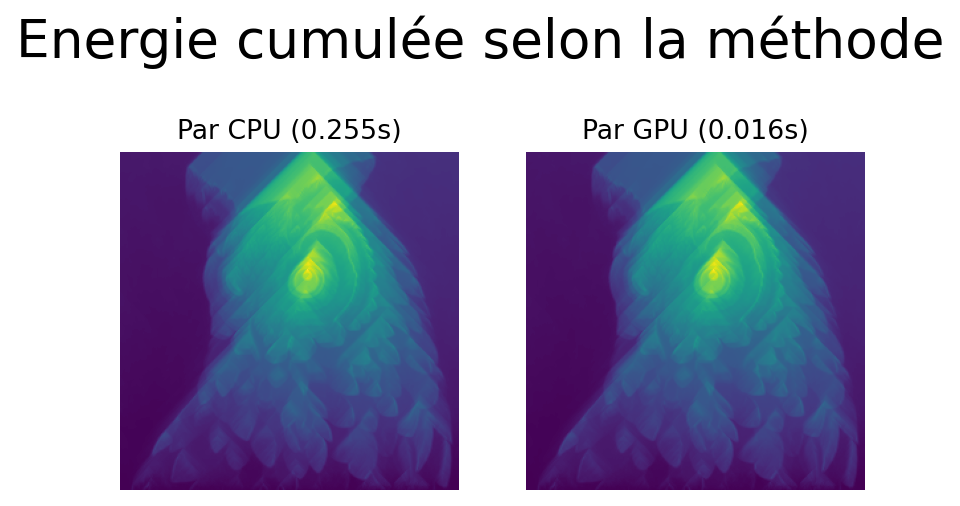

In [13]:
fig, axes = plt.subplots(1, 2, dpi=160)
for ax in axes: ax.axis('off')
ax_l, ax_r = axes

axesData = [
    {
        'ax': ax_l,
        'title': f'Par CPU ({t_cpu:.3f}s)',
        'img': image_cumulate_cpu
    },
    {
        'ax': ax_r,
        'title': f'Par GPU ({t_gpu:.3f}s)',
        'img': image_cumulate_gpu
    }
]

fig.suptitle("Energie cumulée selon la méthode", fontsize=24)
for axData in axesData:
    ax = axData['ax']
    ax.set_title(axData['title'])
    ax.imshow(axData['img'])


d = np.linalg.norm(image_cumulate_cpu - image_cumulate_gpu)

print('cpu:')
print(image_seams_cpu)

print()
print('gpu:')
print(image_seams_gpu)
print()

print('Distance entre les deux image: ', d)

On souhaite vérifier que les résultats sont identiques. A vue d'oeil, les résultats semblent bien identiques.

Le temps mesuré cumul tous les calculs: chemins, et extractions des coutures, même le passage des textures. Le seul calcul qui n'est pas inclus est celui du calcul de l'image d'énergie, car le _seam carving_ n'est pas dépendant de la méthode du calcul de l'énergie et plusieurs versions sont possibles (et, dans notre cas, que l'on a déjà optimisé en utilisant le filtre de Sobel grâce à `scipy`).

On peut visualiser les chemins locaux pour être sûr que l'implémentation est correcte. On ne peut pas savoir à 100%,
car lors de l'affichage, les valeurs en X sont représentés par une couleur. Cependant, la couleur entre deux pixels
voisins verticalement doit être proche car on n'autorise un déplacement que d'un seul pixel au maximum vers la gauche 
ou vers la droite, ce qui se traduit par une couleur quasiment identique.

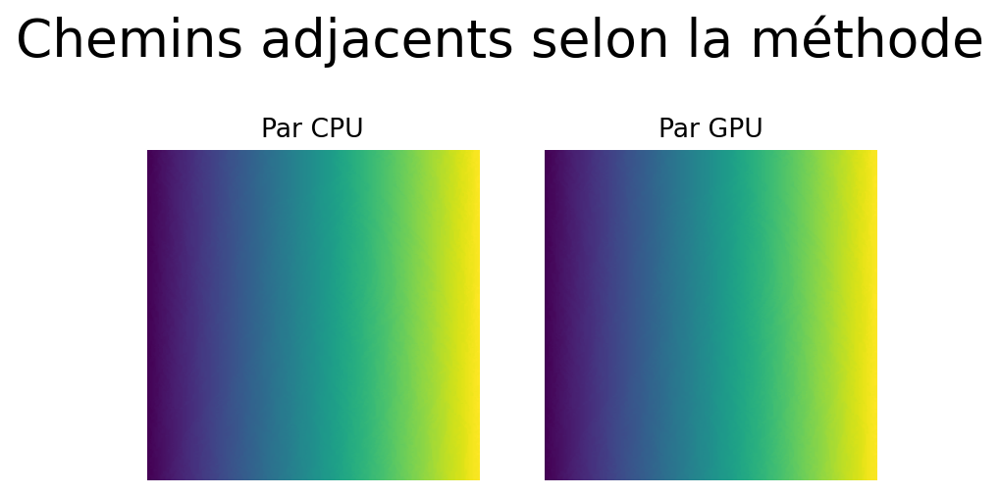

In [14]:
fig, axes = plt.subplots(1, 2, dpi=160)
for ax in axes: ax.axis('off')
ax_l, ax_r = axes

axesData = [
    {
        'ax': ax_l,
        'title': f'Par CPU',
        'img': image_chemins_cpu.astype(np.float32)
    },
    {
        'ax': ax_r,
        'title': f'Par GPU',
        'img': image_chemins_gpu.astype(np.float32)
    }
]

fig.suptitle("Chemins adjacents selon la méthode", fontsize=24)
for axData in axesData:
    ax = axData['ax']
    ax.set_title(axData['title'])
    ax.imshow(axData['img'])

cpu:
[[  0   1   2 ...   4   5   5]
 [  1   2   2 ...   4   5   5]
 [  2   2   2 ...   4   5   5]
 ...
 [253 253 253 ... 253 252 252]
 [254 253 253 ... 253 252 252]
 [255 254 253 ... 253 252 252]]

gpu:
[[  0   1   1 ...   2   1   0]
 [  1   2   1 ...   2   1   0]
 [  2   2   1 ...   2   1   0]
 ...
 [253 253 253 ... 253 252 252]
 [254 253 253 ... 253 252 252]
 [255 254 253 ... 253 252 252]]

Distance entre les deux image:  910.2422754409948


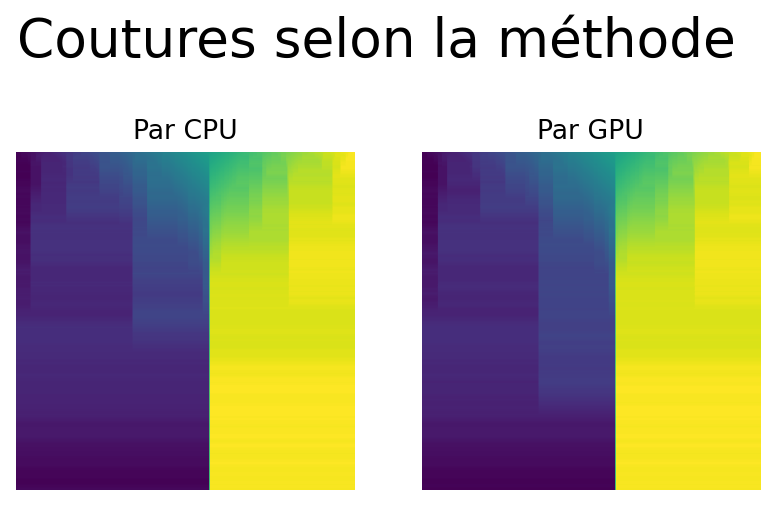

In [15]:
fig, axes = plt.subplots(1, 2, dpi=160)
for ax in axes: ax.axis('off')
ax_l, ax_r = axes

# On transpose pour l'affichage, car à la base le tableau 2D des coutures
# ne contient pas une image
# pour siplifier, on stocke l'indice de la couture en premier indice (ligne)
# mais ceux-ci correspondent bien à une colonne.

axesData = [
    {
        'ax': ax_l,
        'title': f'Par CPU',
        'img': image_seams_cpu.transpose().astype(np.float32)
    },
    {
        'ax': ax_r,
        'title': f'Par GPU',
        'img': image_seams_gpu.transpose().astype(np.float32)
    }
]

fig.suptitle("Coutures selon la méthode", fontsize=24)
for axData in axesData:
    ax = axData['ax']
    ax.set_title(axData['title'])
    ax.imshow(axData['img'])

  
d = np.linalg.norm(image_seams_cpu - image_seams_gpu)

print('cpu:')
print(image_seams_cpu)

print()
print('gpu:')
print(image_seams_gpu)
print()

print('Distance entre les deux image: ', d)

Nous pouvons maintenant implémenter une version interactive qui sera plus réactive.

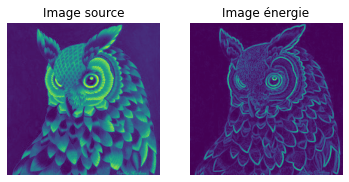

interactive(children=(IntSlider(value=192, description='x', max=243), Output()), _dom_classes=('widget-interac…

In [16]:
image_src = plt.imread('data/sample2.jpg')[:, :, 0].astype(dtype=np.float)
image_energie_original = sobel_filter(image_src)
m, n = image_src.shape[:2]

def get_lowest_energy_seam_index(image_energie, seams):
    return np.argmin([compute_seam_energy(image_energie, s) for s in seams])

def get_lowest_energy_seam(image_energie, seams):
    return seams[get_lowest_energy_seam_index(image_energie, seams)]

def seam_carving_reduce_width_once(image_src, energizer):
    # Retire le chemin de plus basse énergie
    image_dst = np.copy(image_src)
    
    image_energie = energizer(image_src)
    
    
    seams = SeamCarvingGPU.extraire_coutures(image_energie)
    
    lowest_energy_seam = get_lowest_energy_seam(image_energie, seams)
    
    m, n = image_src.shape[:2]
    
    # retire les pixels de chaque ligne un à un
    for i in range(m):
        
        j_to_delete = lowest_energy_seam[i]
        image_dst[i, 1 : j_to_delete + 1] = image_src[i, 0 : j_to_delete]
    
    # Retire la première colonne car on a tout décalé vers l'avant
    image_dst = np.delete(image_dst, 0, axis=1)
    
    return image_dst

def animation_reduce_width_do(image_src, x, energizer):
    # Sans cache
    
    image = image_src
    
    for i in range(x):

        image = seam_carving_reduce_width_once(image, energizer)
    
    fig, ax = plt.subplots(dpi=160)
    ax.set_title(f"Réduction de {x} en largeur")
    ax.imshow(image)

def animation_reduce_width(image_src, max=0.95, init=0.75, energizer=sobel_filter): # max, init en pourcentage
    
    n = image_src.shape[1]
    max = int(n * max)
    value = int(n * init)
    
    interact(lambda x: animation_reduce_width_do(image_src, x, energizer), x=widgets.IntSlider(min=0, max=max, step=1, value=value))


fig, (ax_left, ax_right) = plt.subplots(1, 2)

ax_left.axis('off')
ax_right.axis('off')

ax_left.set_title('Image source')
ax_left.imshow(image_src);

ax_right.set_title('Image énergie')
ax_right.imshow(image_energie_original)

def run():
    animation_reduce_width(image_src)


run()

En plus de comparer les deux méthdes, on peut aussi expliquer l'image obtenue.
Celle-ci obtient cette forme car les coutures s'aggrègent autour des coins en bas à gauche et en bas à droite de l'image,
car ces endroits sont les seules zones du bord de l'image qui appartienent au fond. Les coutures ne
passent jamais par le centre qui représente l'objet principal (la chouette). C'est pourquoi la couleur, qui représente
la position en X de la couture à cette ligne, se scinde très rapidement en deux. Même si l'on a l'impression qu'elle est scindée
en deux dès le début, les premiers pixels du haut à la limite ont valeurs très proches.

Enfin, on peu valider que les deux algorithmes donnent des résultats similaires avec une performance bien supérieure sur l'architecture de test utilisée.

## Agrandissement d'image en largeur

Pour agrandir une image, on effectue quelque part le procédé inverse en _rajoutant_ des coutures.
De par leurs propriétés, chaque nouvelle couture ajoutée dans la dimension souhaitée augmente la taille de l'image de 1.

Si on considère que l'opération de rétrécissement pour retirer 1 pixel est $I^{(1)}$, on peut considérer le fait d'ajouter
1 pixel comme la recherche de l'image, qui quand elle est rétrécie d'un pixel par le *seam carving*, devient l'image originale.
C'est un peu comme si on remontait le temps avant application du *_seam carving*, c'est pourquoi on pourra noter cette opération $I^{(-1)}$.

Mais comment rajouter une couture ? Il faut faire la part des choses entre rajouter du contenu important et du contenu d'arrière-plan (peu énergetique à l'image), mais bien souvent, un agrandissement qui rend le contenu plus petit est satisfaisant. Ce sera alors l'arrière-plan qui sera ajouté, c'est-à-dire des coutures de faible énergie.

###### Ajout d'un unique pixel

On ajoutera un unique pixel dans la dimension souhaité en dupliquant la couture de plus faible énergie. Ainsi, on est relativement certains que celle-ci serait retiré si on souhaiterait rétrécir l'image obtenue. Cependant, il faut noter que ce résultat n'est pas garanti. On pourra rendre l'effet plus réaliste en lissant la couture ajoutée avec les voisins gauche et droits.

In [17]:
def duplicate_seam(image_src, seam):
    m, n = image_src.shape[:2]
    image_dst = np.zeros(shape=(m, n + 1))
    
    # copie chaque ligne, en insérant au milieu le chemin dupliqué
    for i in range(m):
        
        j_to_duplicate = seam[i]
        
        # copie deux fois le pixel du milieu exprès pour le dupliquer
        image_dst[i, : j_to_duplicate + 1] = image_src[i, : j_to_duplicate + 1]
        image_dst[i, j_to_duplicate + 1 :] = image_src[i, j_to_duplicate :]
        
        # lisse linéairement à droite et à gauche du pixel ajouté
        
        if j_to_duplicate != 0: # à gauche
            image_dst[i, j_to_duplicate] = (image_dst[i, j_to_duplicate] + image_dst[i, j_to_duplicate - 1]) / 2
        
        if j_to_duplicate != n - 1: # à droite
            image_dst[i, j_to_duplicate + 1] = (image_dst[i, j_to_duplicate + 1] + image_dst[i, j_to_duplicate + 2]) / 2
        
        
    return image_dst

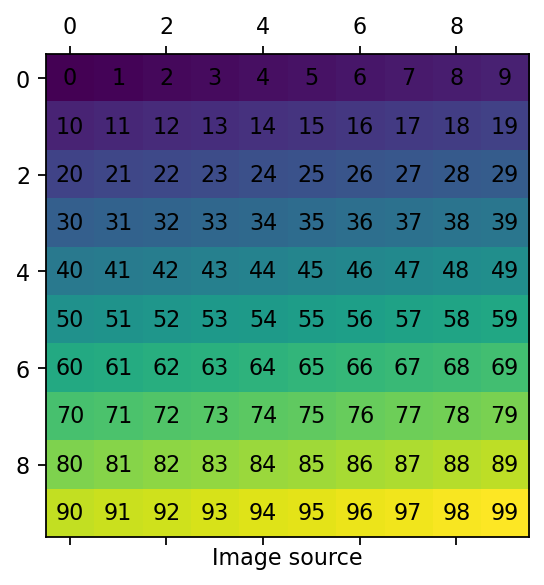

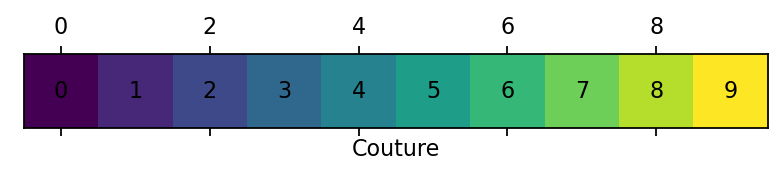

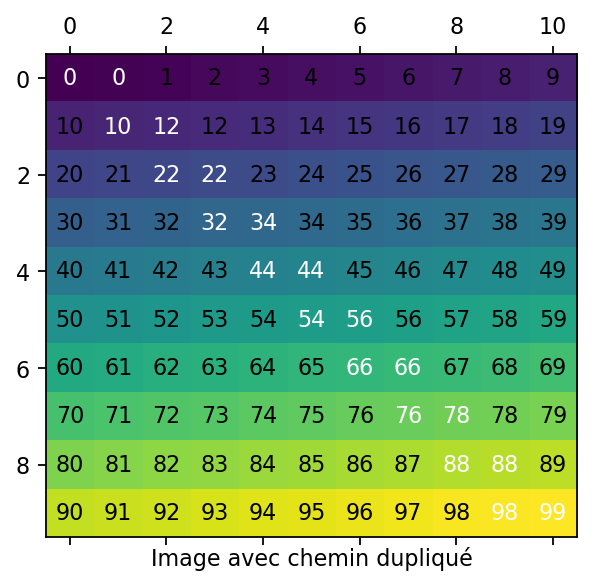

In [18]:
image_src = np.arange(100).reshape(10, 10)
seam = np.arange(10)
image_dst = duplicate_seam(image_src, seam)

matshow(image_src, title='Image source', integer=True, cmap='viridis', dpi=160)
matshow(np.atleast_2d(seam), title='Couture', integer=True, cmap='viridis', dpi=160)

fig, ax = matshow(image_dst, integer=True, title='Image avec chemin dupliqué', cmap='viridis', dpi=160, text=False)

for (i, j), z in np.ndenumerate(image_dst):
    format = '{:0.0f}'
    color = 'black'
    
    if seam[i] == j or seam[i] == j - 1:
        color = 'white'
    
    ax.text(j, i, format.format(z), ha='center', va='center', color=color)

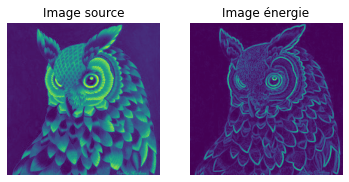

interactive(children=(IntSlider(value=0, description='x', max=255), Output()), _dom_classes=('widget-interact'…

In [19]:
image_src = plt.imread('data/sample2.jpg')[:, :, 0].astype(dtype=np.float)
image_energie_original = sobel_filter(image_src)
m, n = image_src.shape[:2]

images_cache = [None] * m
images_cache[0] = image_src
image_energie = sobel_filter(image_src)

def seam_carving_increase_width_once(image_src):
    image_energie = sobel_filter(image_src)
    seams = extract_seams_energy(image_energie)
    lowest_energy_seam = get_lowest_energy_seam(image_energie, seams)
    image_dst = duplicate_seam(image_src, lowest_energy_seam)
    return image_dst

def interact_seam_carving_increase_width_once(x):
    
    for i in range(x + 1):

        if images_cache[i] is not None:    
            image = images_cache[i]
        
        else:
            image = seam_carving_increase_width_once(image)
            images_cache[i] = image
    
    fig, ax = plt.subplots(dpi=160)
    ax.set_title(f"Agrandissement de {x} pixels en largeur (pas de fenêtre)")
    ax.imshow(image)

fig, (ax_left, ax_right) = plt.subplots(1, 2)

ax_left.axis('off')
ax_right.axis('off')

ax_left.set_title('Image source')
ax_left.imshow(image_src);

ax_right.set_title('Image énergie')
ax_right.imshow(image_energie);

interact(interact_seam_carving_increase_width_once, x=widgets.IntSlider(min=0, max=m - 1, step=1, value=0));

###### Ajout de $k$ pixels

Cependant, pour rajouter plus d'un seul pixel, cette méthode montre ses limites, car c'est souvent la même couture qui va être ajoutée. On pourra alors, pour agrandir de $n$ pixels, séparer l'opération en fenêtre d'aggrandissements de $k$ pixels qui consistera à non plus dupliquer à chaque étape la couture la moins énergétique, mais dupliquer les $k^{ièmes}$ coutures les moins énergétiques. Cela évite l'apparition d'artefacts trop importants, apparemment quand l'agrandissement est au-delà de 50%, car sans gérer les $k$ dernières coutures, les coutures seront recalculer à chaque nouveau pixel d'ajouté.

Il faut noter cependant que cette méthode à ses limites et peut fortement altérer l'image. On pourra utiliser une autre fonction d'énergie grâce à d'autres techniques (détourage, reconaissance faciale) pour améliorer les résultats.

# Suppression d'objets

Avec le *seam carving*, il est aussi possible de supprimer des objets d'une image. De façon surprenante, car l'algorithme est un
algorithme de redimensionnement. Cependant, qui dit redimensionnement dit aussi supression de pixels.
Et comme nous pouvons choisir de la fonction d'énergie, nous pouvons aussi indiquer quels pixels sont à supprimer.
Pour tester, nous allons marquer une certaine zone avec une énergie très faible, voir négative pour être sûr que les
chemins y passent.

Les images utilisées proviennent de la base de données d'image en ligne **unsplash.com**.

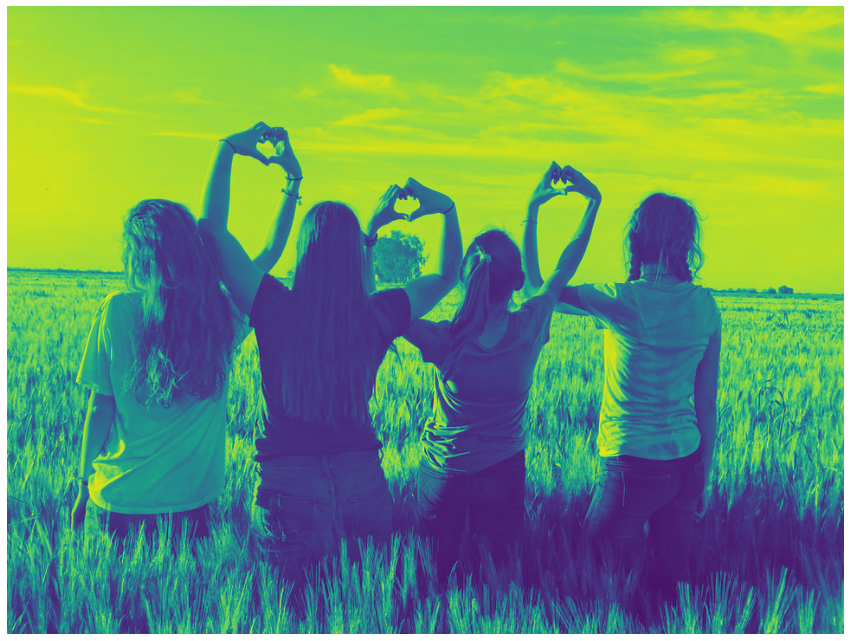

In [20]:
image_colored = plt.imread('data/sample3.jpg')
image_src = image_colored[:, :, 1].astype(dtype=np.float32)
imshow(image_src, figsize=(15, 15))

Nous allons essayer de supprimer les gens qui apparaissent sur cette photo. Pour cela, nous allons utiliser un masque que l'on a préalablement construit à la main, avec une couleur n'apparaissant pas dans l'image. Comme on a construit nous-même le masque, on connait la position d'un de ses pixels et on connait par conséquent la couleur utilisée.

On observe pour qu'à coup sûr une couture passe par cette zone, pour une image de $m$ lignes et $n$ colonnes et d'une intensité par pixel maximum de $i^{max}$, il faut que l'energie du pixel marqué $e_r$ soit au moins inférieure à $-m * i^{max}$, à condition que le pixel soit accessible depuis la couture. La raison est que ainsi tout chemin passant par ce pixel aura forcément une énergie inférieure à zéro, donc supérieure pour tout fonction d'énergie "normale", comme celle utilisée ici (filtre de Sobel).

On utilisera des marques en .bmp, format qui à l'avantage ici de ne pas compresser les pixels, donc pas d'interpolation. La couleur du masque est exactement celle dessinée.

Couleur de masque: 236.0


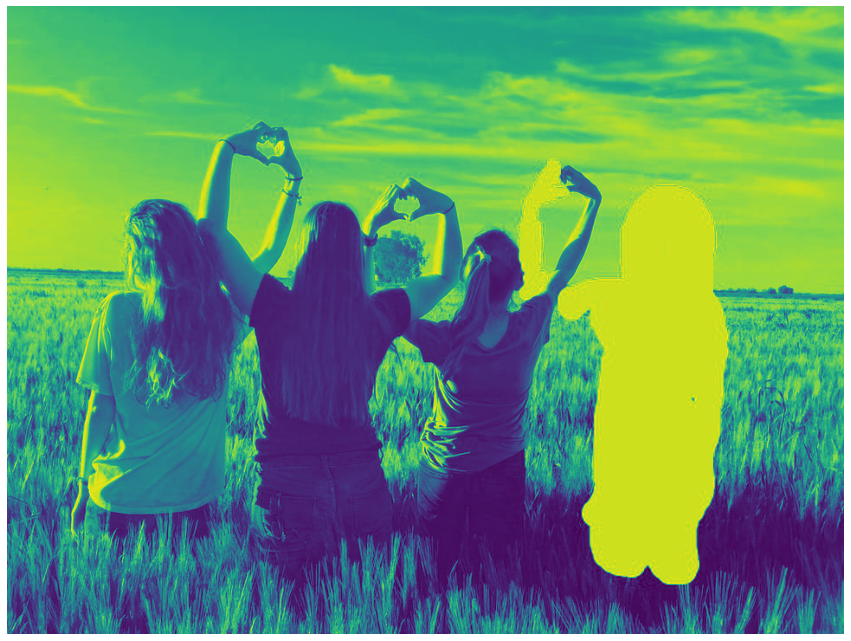

In [21]:
image_mask = plt.imread('data/sample3_mask1.bmp')[:, :, 0].astype(dtype=np.float)
mask_coords = (300, 750)
mask_color = image_mask[mask_coords]

print('Couleur de masque:', mask_color)

imshow(image_mask, figsize=(15, 15))

def is_marked(coords):
    return image_mask[coords] == mask_color

e_mark = 0



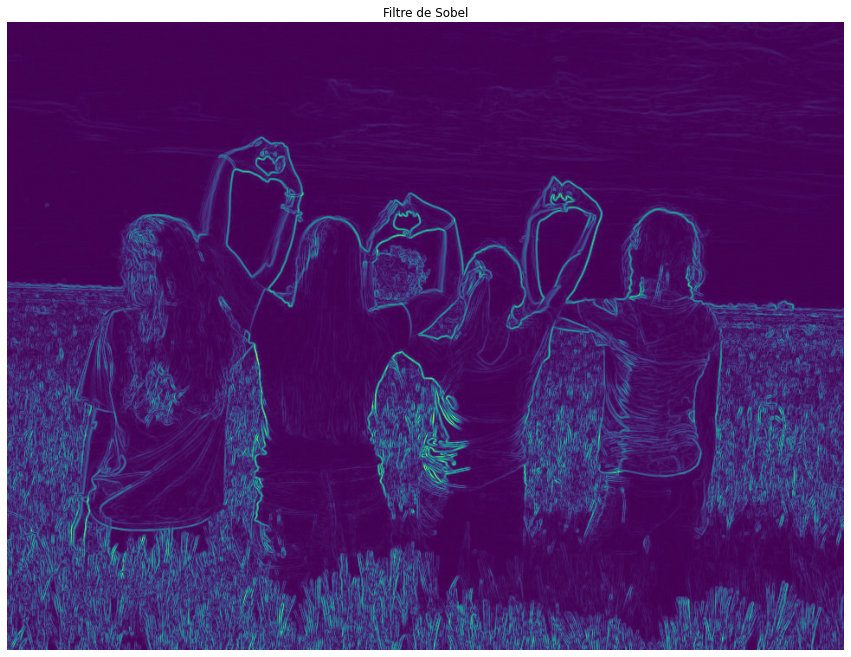

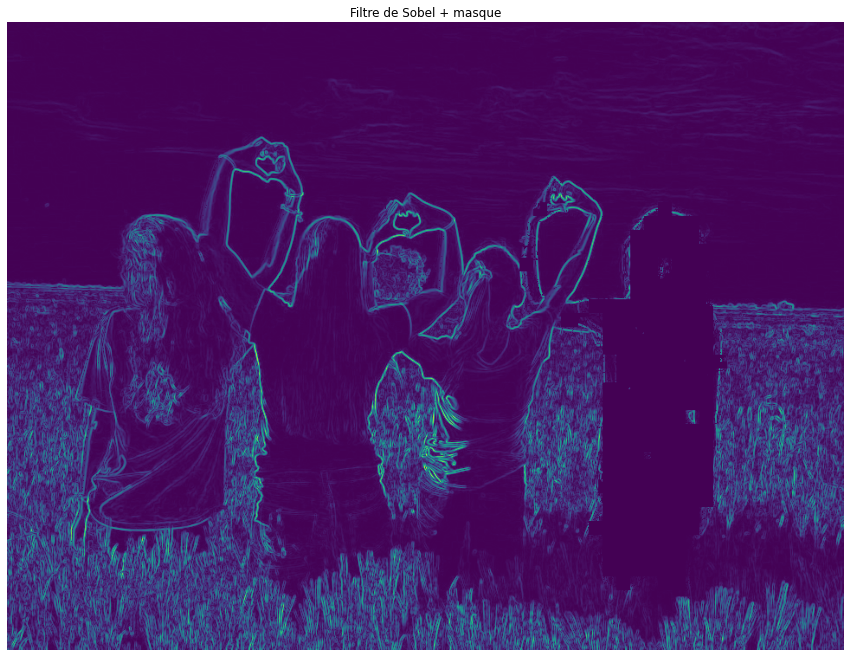

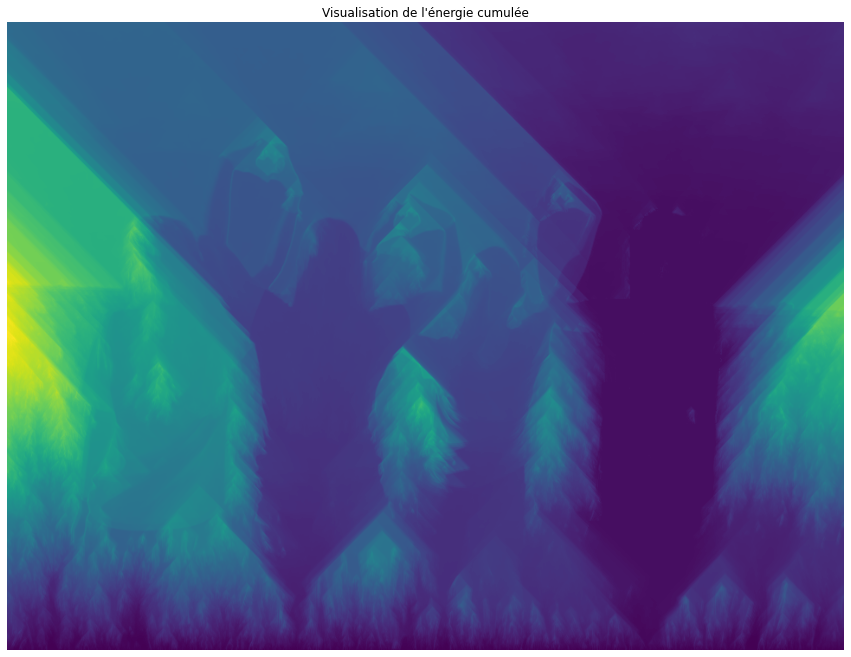

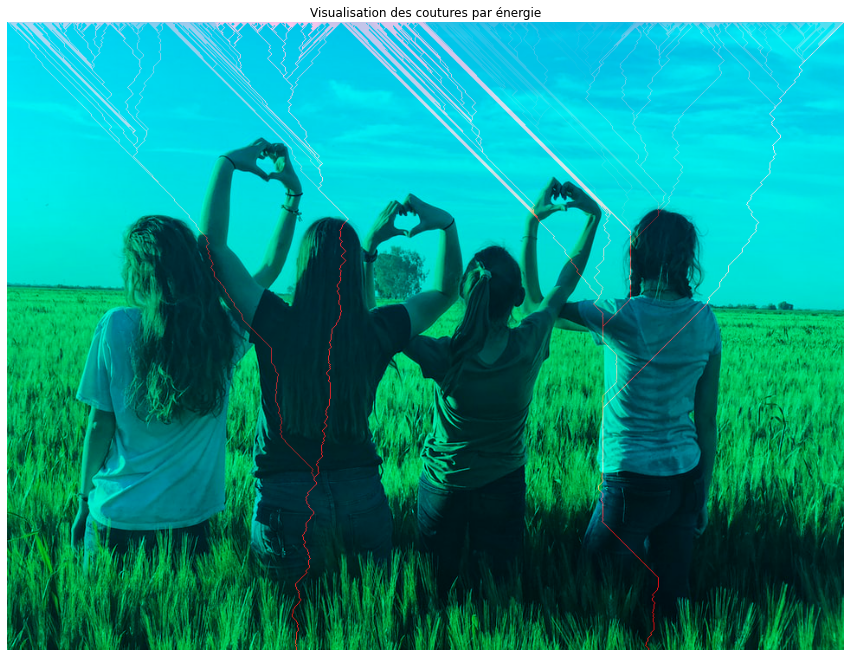

interactive(children=(IntSlider(value=0, description='x', max=300), Output()), _dom_classes=('widget-interact'…

In [22]:
image_energie = sobel_filter(image_src)
imshow(image_energie, figsize=(15, 15), title='Filtre de Sobel')

# même à -1000, cela n'est pas suffisant
MARK_ENERGY = -image_src.shape[0] * 255
MARK_ENERGY = 0

print('e_mark =', MARK_ENERGY)

for i, x in np.ndenumerate(image_src):
    if is_marked(i):
        image_energie[i] = MARK_ENERGY


imshow(image_energie, figsize=(15, 15), title='Filtre de Sobel + masque')

vizualize_cumulated_energy(image_colored, image_energie)

print()
interact(lambda x: animation_reduce_width_do(image_src, sobel_filter, x), x=widgets.IntSlider(min=0, max=300, step=1, value=0));

Les résultats étant peu convaincant, essayont une autre stratégie: au lieu de modifier l'énergie du masque, essayont de modifier l'énergie à l'extérieur de masque on les rendant très énergétiques. Cependant, les résultats ont montrés que même ainsi, le problème n'était pas réglé, car celu-ici était plus simple: il s'agissait d'un bug. En effet, la fonction d'analyse de l'énergie n'avait pas été modifiée, mais elle est pourtant très importante dans la recherche des minimas d'énergie. Il s'agissait du filtre de Sobel non-actualisé pour nos besoins. En fait, le masque doit lui aussi être actualisé pour retirer les chemins car la suppression des chemins est récursive. Il s'agit à chaque fois de retirer le dernier chemin le moins énergétique $k$ fois, et non pas retirer les $k$ chemins les moins énergétiques. Cela pourrait amener à des résultats différents.

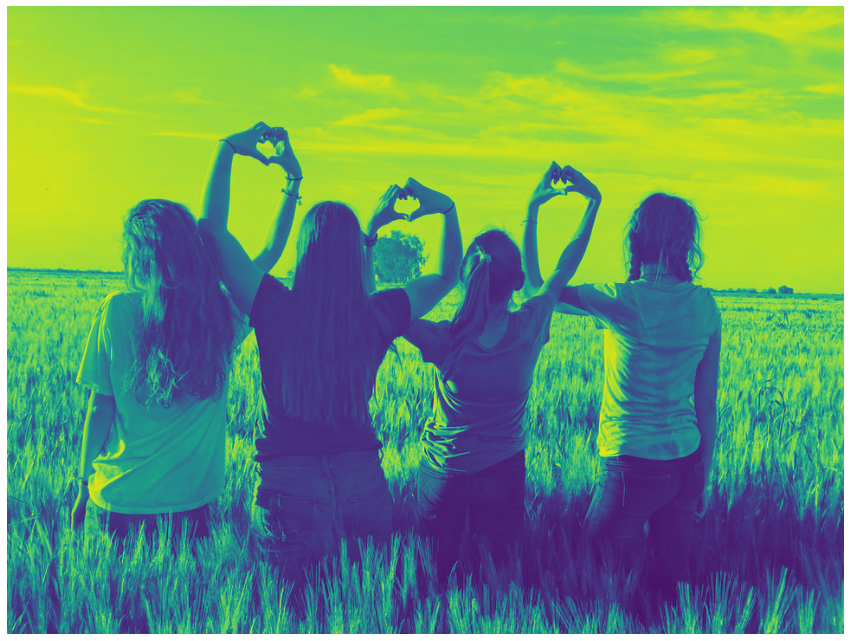

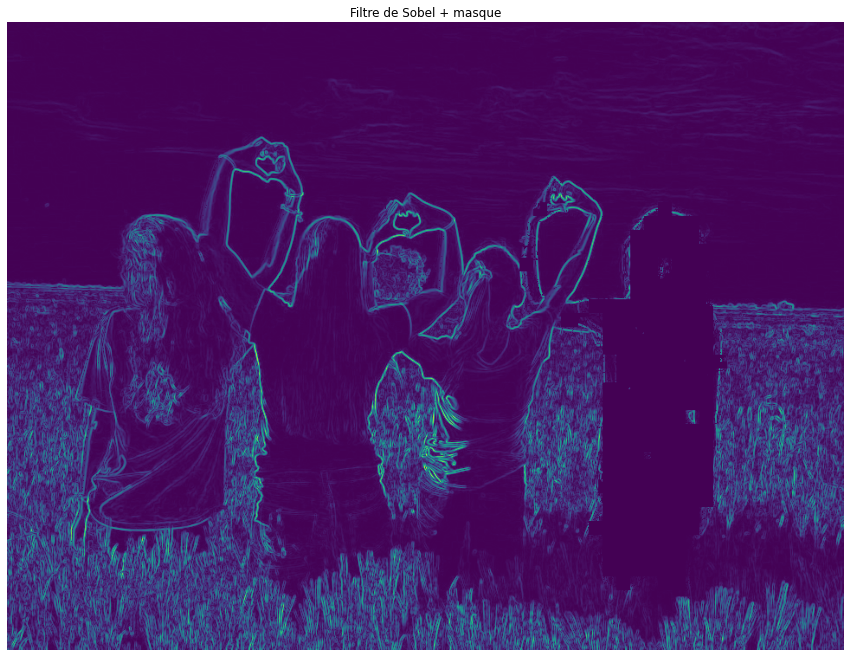

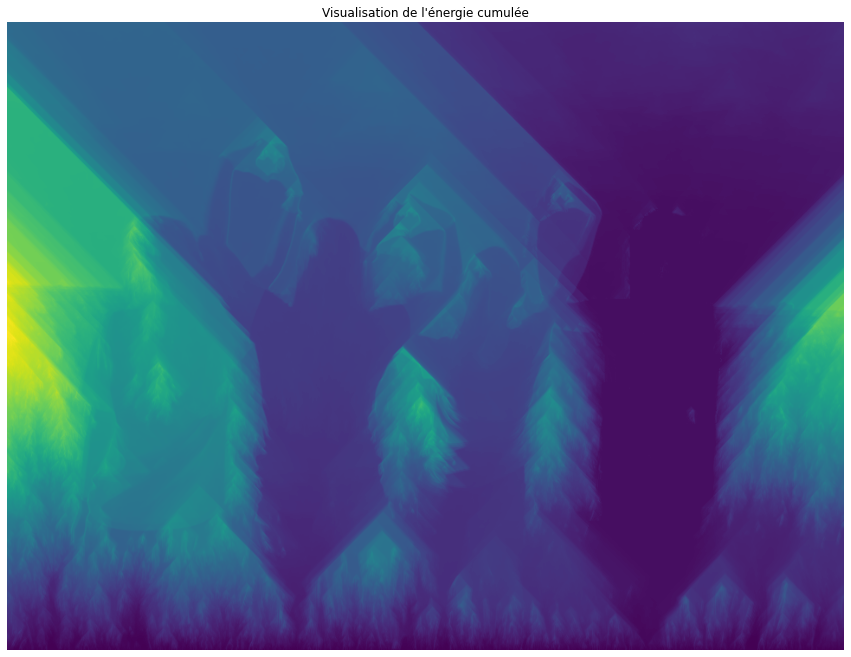

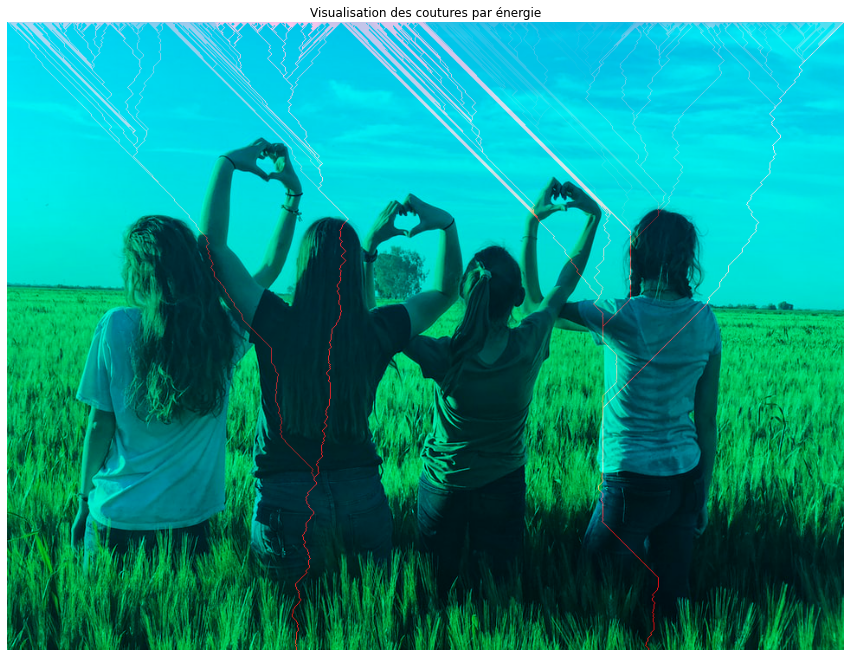

In [23]:
image_colored = plt.imread('data/sample3.jpg')
image_src = image_colored[:, :, 1].astype(dtype=np.float32)
imshow(image_src, figsize=(15, 15))
image_mask = plt.imread('data/sample3_mask1.bmp')[:, :, 0].astype(dtype=np.float)
mask_coords = (300, 750)
mask_color = image_mask[mask_coords]
pixels_in_mask = []

def filtre_detourage(image_src):
    e_offset = -10000 # énergie à retirer
    
    image_nrj = sobel_filter(image_src)
    
    for i in pixels_in_mask:
        image_nrj[i] += e_offset
    
    return image_nrj
    
def is_marked(coords):
    return image_mask[coords] == mask_color

for i, x in np.ndenumerate(image_src):
    if is_marked(i):
        pixels_in_mask.append(i)

imshow(image_energie, figsize=(15, 15), title='Filtre de Sobel + masque')

vizualize_cumulated_energy(image_colored, image_energie)



Nous visualisons le problème: les chemins qui sont *obligés* de passer par le masque suppriment aussi des parties importantes de l'images qui sont ignorés.


## Redimensionnement sur deux dimension

Nous savons maintenant redimensionner sur chaqune deux dimensions. Mais comment redimensionner les deux en même temps ?
Pour cela, il suffit de rechercher à chaque étapes les chemins à la fois horizontalement et verticalement.
Ainsi, à chaque étape, on  réduit la taille de 1 dans une des dimensions, jusqu'à ce qu'il ne reste qu'une seule
dimension à réduire, nous ramenant au cas précédent.


## Limitations

L'efficacité de l'algorithme est fortement déterminée par la qualité de la fonction d'énergie, qu'il faut donc choisir judicieusement.

Le coût en calcul est très élevé par rapport aux autres méthodes de redimensionnement, et des optimisations sont possibles en parallélisant massivement les opérations qui heureusement sont parallélisables dans la plupart des cas dans au moins une dimension.


# Conclusion

Les applications du redimensionneement intelligent **seam carving** sont nombreuses, et de nombreuses optimisations sont possibles.
Au-delà du but initial, cette méthode peut être utile dans de nombreux domaines, comme par exemple retirer des objets d'une image.